In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install opencv-python

In [3]:
pip install imutils

In [4]:
from imutils import paths
from google.colab.patches import cv2_imshow
import cv2
import os

In [5]:
model_path = "/content/drive/MyDrive/DisasterModel"

cyclone_path = '/content/drive/MyDrive/DisasterModel/Cyclone_Wildfire_Flood_Earthquake_Dataset/Cyclone'
earthquake_path = '/content/drive/MyDrive/DisasterModel/Cyclone_Wildfire_Flood_Earthquake_Dataset/Earthquake'
flood_path = '/content/drive/MyDrive/DisasterModel/Cyclone_Wildfire_Flood_Earthquake_Dataset/Flood'
wildfire_path = '/content/drive/MyDrive/DisasterModel/Cyclone_Wildfire_Flood_Earthquake_Dataset/Wildfire'

train_path = os.path.join(model_path, 'train')
test_path = os.path.join(model_path, 'test')
validation_path = os.path.join(model_path, 'validation')

train_path_c = os.path.join(train_path, 'cyclone')
train_path_e = os.path.join(train_path, 'earthquake')
train_path_f = os.path.join(train_path, 'flood')
train_path_w = os.path.join(train_path, 'wildfire')

test_path_c = os.path.join(test_path, 'cyclone')
test_path_e = os.path.join(test_path, 'earthquake')
test_path_f = os.path.join(test_path, 'flood')
test_path_w = os.path.join(test_path, 'wildfire')

validation_path_c = os.path.join(validation_path, 'cyclone')
validation_path_e = os.path.join(validation_path, 'earthquake')
validation_path_f = os.path.join(validation_path, 'flood')
validation_path_w = os.path.join(validation_path, 'wildfire')

print('Validate if the samples images are the same size:\n')

print('Train:')
print(len(os.listdir(train_path_c)), len(os.listdir(train_path_e)), len(os.listdir(train_path_f)), len(os.listdir(train_path_w)))
print('\n')

print('Test:')
print(len(os.listdir(test_path_c)), len(os.listdir(test_path_e)), len(os.listdir(test_path_f)), len(os.listdir(test_path_w)))
print('\n')

print('Validation:')
print(len(os.listdir(validation_path_c)), len(os.listdir(validation_path_e)), len(os.listdir(validation_path_f)), len(os.listdir(validation_path_w)))

Validate if the samples images are the same size:

Train:
400 400 400 400


Test:
100 100 100 100


Validation:
100 100 100 100


In [6]:
# Initialize class labels for the dataset
CWFE = "Cyclone_Wildfire_Flood_Earthquake_Dataset"

subfolders = ['Cyclone', 'Earthquake', 'Flood', 'Wildfire']

imagePaths = list(paths.list_images(model_path))

images = []
labels = []

In [7]:
imagePaths

['/content/drive/MyDrive/DisasterModel/train/cyclone/1.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/104.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/105.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/101.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/103.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/106.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/10.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/0.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/100.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/102.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/12.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/119.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/122.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/117.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/110.jpg',
 '/content/drive/MyDrive/DisasterModel/train/cyclone/107.jpg'

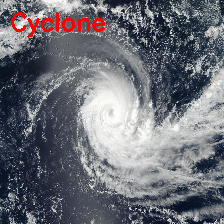

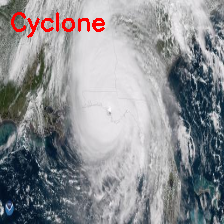

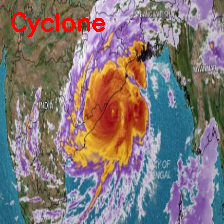

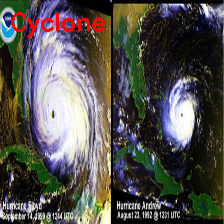

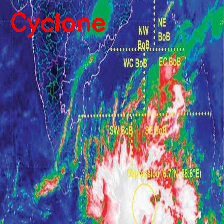

...

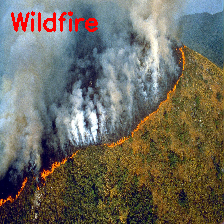

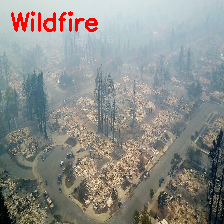

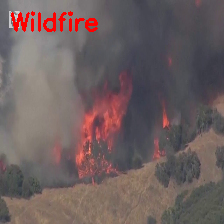

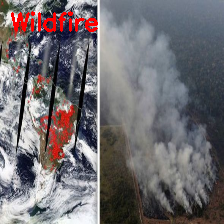

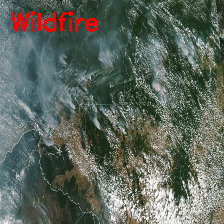

In [8]:
for subfolder in subfolders:
  subfolder_path_CWFE = os.path.join(model_path, CWFE)
  subfolder_path = os.path.join(subfolder_path_CWFE, subfolder)

  count = 0

  for filename in os.listdir(subfolder_path):
    image = cv2.imread(os.path.join(subfolder_path, filename))

    # Image Pre-Processing Techniques
    image = cv2.resize(image, (224, 224))

    # Adding the loaded image to the images list -> images []
    images.append(image)

    # Append labels of subfolder names to labels list -> labels []
    label = subfolder
    labels.append(label)

    # Add label text to the image to display the image with its corresponding label
    cv2.putText(image, str(label), (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

    # Display the Images
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

    #Display 10 Images from each disaster
    count += 1
    if (count == 11):
      break

In [9]:
# Import necessary libraries for data training

import os
import importlib
import numpy as np
import tensorflow as tf
import importlib
import numpy as np
import json
import keras
import random
import cv2 as cv
import matplotlib.pyplot as plt
from keras import Model
from keras.preprocessing import image
from keras import callbacks
from keras.callbacks import EarlyStopping
from datetime import datetime
from keras import optimizers
from keras.backend import dropout
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, Dropout, Activation, MaxPooling2D
#from keras.utils.np_utils import to_categorical
from keras.regularizers import l2
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score

In [10]:
# Training and defining the disaster scene detection model

model_disaster = None

# Define the paths to save the model and its history
model_path = '/content/drive/MyDrive/DisasterModel/best_model.h5'
model_history_path = '/content/drive/MyDrive/DisasterModel/history'

# Check if the model and its history exist
model_exists = os.path.exists(model_path)
history_exists = os.path.exists(model_history_path)

# Define the disaster scene detection model
model_disaster = Sequential()

if model_exists:
    model_disaster = load_model(model_path)

else:
   # Defining a CNN model that extracts features from the disaster scenes
   # using multiple convolutional layers
    model_disaster.add(Conv2D(32, (3,3), input_shape = (180, 180, 3)))
    model_disaster.add(Activation('relu'))
    model_disaster.add(MaxPooling2D((2, 2)))

    model_disaster.add(Conv2D(64, (3,3)))
    model_disaster.add(Activation('relu'))
    model_disaster.add(MaxPooling2D((2, 2)))

    model_disaster.add(Conv2D(128, (3,3)))
    model_disaster.add(Activation('relu'))
    model_disaster.add(MaxPooling2D((2, 2)))

    model_disaster.add(Conv2D(128, (3,3)))
    model_disaster.add(Activation('relu'))
    model_disaster.add(MaxPooling2D((2, 2)))

    model_disaster.add(Flatten())
    model_disaster.add(Dropout(0.3))
    model_disaster.add(Dense(512, activation = 'relu'))
    model_disaster.add(Dense(4, activation = 'softmax'))

model_disaster.summary()

if not model_exists:
    model_disaster.compile(optimizer=optimizers.RMSprop(learning_rate=1e-3), loss='categorical_crossentropy', metrics=['acc'])
    # Adam optimizer is not good for this dataset
    # Rate produces best results

# Image data augmentation generator for test
datagen = ImageDataGenerator(
    rescale= 1./255,
    rotation_range= 40,
    width_shift_range= .2,
    height_shift_range= .2,
    shear_range= .2,
    zoom_range= .2,
    horizontal_flip= True)

testgen = ImageDataGenerator(rescale= 1./255)

# Image data augmentation for training
train_generator = datagen.flow_from_directory(
    train_path,
    target_size= (180, 180),
    batch_size=32,
    class_mode='categorical'
    )

# Image data augmentation for validation
validation_generator = testgen.flow_from_directory(
    validation_path,
    target_size=(180, 180),
    batch_size=32,
    class_mode='categorical'
    )

print('\n\nCheck a size of data/label batches:')
for data_batch, label_batch in train_generator:
    print('data batch size:', data_batch.shape)
    print('label batch size:', label_batch.shape)
    break

es = EarlyStopping(monitor='val_acc', mode='max', verbose=1, patience=6)
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 activation (Activation)     (None, 178, 178, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 89, 89, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     
                                                                 
 activation_1 (Activation)   (None, 87, 87, 64)        0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 43, 43, 64)        0         
 g2D)                                                   

In [11]:
history = None

if history_exists:
    with open(model_history_path, 'r') as json_file:
        history = json.load(json_file)
else:
    history = model_disaster.fit(train_generator,steps_per_epoch=50, epochs=30, validation_data=validation_generator, validation_steps=50, callbacks=[es, mc])

Epoch 1/30
50/50 [==============================] - ETA: 0s - loss: 1.2502 - acc: 0.3887 


Epoch 1: val_acc improved from -inf to 0.51750, saving model to best_model.h5
50/50 [==============================] - 660s 13s/step - loss: 1.2502 - acc: 0.3887 - val_loss: 1.1062 - val_acc: 0.5175


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 2/30
50/50 [==============================] - ETA: 0s - loss: 1.1142 - acc: 0.5238

50/50 [==============================] - 143s 3s/step - loss: 1.1142 - acc: 0.5238
Epoch 3/30
50/50 [==============================] - ETA: 0s - loss: 0.9572 - acc: 0.6075

50/50 [==============================] - 146s 3s/step - loss: 0.9572 - acc: 0.6075
Epoch 4/30
50/50 [==============================] - ETA: 0s - loss: 0.8126 - acc: 0.6725

50/50 [==============================] - 141s 3s/step - loss: 0.8126 - acc: 0.6725
Epoch 5/30
50/50 [==============================] - ETA: 0s - loss: 0.7062 - acc: 0.7194

50/50 [==============================] - 145s 3s/step - loss: 0.7062 - acc: 0.7194
Epoch 6/30
50/50 [==============================] - ETA: 0s - loss: 0.6695 - acc: 0.7481

50/50 [==============================] - 148s 3s/step - loss: 0.6695 - acc: 0.7481
Epoch 7/30
50/50 [==============================] - ETA: 0s - loss: 0.6658 - acc: 0.7387

50/50 [==============================] - 145s 3s/step - loss: 0.6658 - acc: 0.7387
Epoch 8/30
50/50 [==============================] - ETA: 0s - loss: 0.6113 - acc: 0.7750

50/50 [==============================] - 140s 3s/step - loss: 0.6113 - acc: 0.7750
Epoch 9/30
50/50 [==============================] - ETA: 0s - loss: 0.6089 - acc: 0.7794

50/50 [==============================] - 140s 3s/step - loss: 0.6089 - acc: 0.7794
Epoch 10/30
50/50 [==============================] - ETA: 0s - loss: 0.5809 - acc: 0.7744

50/50 [==============================] - 138s 3s/step - loss: 0.5809 - acc: 0.7744
Epoch 11/30
50/50 [==============================] - ETA: 0s - loss: 0.5546 - acc: 0.7981

50/50 [==============================] - 148s 3s/step - loss: 0.5546 - acc: 0.7981
Epoch 12/30
50/50 [==============================] - ETA: 0s - loss: 0.5087 - acc: 0.8138

50/50 [==============================] - 140s 3s/step - loss: 0.5087 - acc: 0.8138
Epoch 13/30
50/50 [==============================] - ETA: 0s - loss: 0.4886 - acc: 0.8250

50/50 [==============================] - 140s 3s/step - loss: 0.4886 - acc: 0.8250
Epoch 14/30
50/50 [==============================] - ETA: 0s - loss: 0.4926 - acc: 0.8138

50/50 [==============================] - 138s 3s/step - loss: 0.4926 - acc: 0.8138
Epoch 15/30
50/50 [==============================] - ETA: 0s - loss: 0.4857 - acc: 0.8125

50/50 [==============================] - 148s 3s/step - loss: 0.4857 - acc: 0.8125
Epoch 16/30
50/50 [==============================] - ETA: 0s - loss: 0.4611 - acc: 0.8256

50/50 [==============================] - 140s 3s/step - loss: 0.4611 - acc: 0.8256
Epoch 17/30
50/50 [==============================] - ETA: 0s - loss: 0.4381 - acc: 0.8369

50/50 [==============================] - 141s 3s/step - loss: 0.4381 - acc: 0.8369
Epoch 18/30
50/50 [==============================] - ETA: 0s - loss: 0.4372 - acc: 0.8319

50/50 [==============================] - 139s 3s/step - loss: 0.4372 - acc: 0.8319
Epoch 19/30
50/50 [==============================] - ETA: 0s - loss: 0.4095 - acc: 0.8500

50/50 [==============================] - 147s 3s/step - loss: 0.4095 - acc: 0.8500
Epoch 20/30
50/50 [==============================] - ETA: 0s - loss: 0.4392 - acc: 0.8375

50/50 [==============================] - 138s 3s/step - loss: 0.4392 - acc: 0.8375
Epoch 21/30
50/50 [==============================] - ETA: 0s - loss: 0.4075 - acc: 0.8512

50/50 [==============================] - 140s 3s/step - loss: 0.4075 - acc: 0.8512
Epoch 22/30
50/50 [==============================] - ETA: 0s - loss: 0.4031 - acc: 0.8619

50/50 [==============================] - 140s 3s/step - loss: 0.4031 - acc: 0.8619
Epoch 23/30
50/50 [==============================] - ETA: 0s - loss: 0.3817 - acc: 0.8650

50/50 [==============================] - 147s 3s/step - loss: 0.3817 - acc: 0.8650
Epoch 24/30
50/50 [==============================] - ETA: 0s - loss: 0.3656 - acc: 0.8606

50/50 [==============================] - 140s 3s/step - loss: 0.3656 - acc: 0.8606
Epoch 25/30
50/50 [==============================] - ETA: 0s - loss: 0.3818 - acc: 0.8569

50/50 [==============================] - 138s 3s/step - loss: 0.3818 - acc: 0.8569
Epoch 26/30
50/50 [==============================] - ETA: 0s - loss: 0.3557 - acc: 0.8731

50/50 [==============================] - 138s 3s/step - loss: 0.3557 - acc: 0.8731
Epoch 27/30
50/50 [==============================] - ETA: 0s - loss: 0.3750 - acc: 0.8669

50/50 [==============================] - 138s 3s/step - loss: 0.3750 - acc: 0.8669
Epoch 28/30
50/50 [==============================] - ETA: 0s - loss: 0.3472 - acc: 0.8681

50/50 [==============================] - 138s 3s/step - loss: 0.3472 - acc: 0.8681
Epoch 29/30
50/50 [==============================] - ETA: 0s - loss: 0.3579 - acc: 0.8763

50/50 [==============================] - 138s 3s/step - loss: 0.3579 - acc: 0.8763
Epoch 30/30
50/50 [==============================] - ETA: 0s - loss: 0.3277 - acc: 0.8844

50/50 [==============================] - 147s 3s/step - loss: 0.3277 - acc: 0.8844


In [12]:
model_path = '/content/drive/MyDrive/DisasterModel'
test_path = os.path.join(model_path, 'test')

best_model = '/content/best_model.h5'

labels = {0: 'cyclone', 1: 'earthquake', 2: 'flood', 3: 'wildfire'}

model_disaster = load_model(best_model)

testgen = ImageDataGenerator(rescale=1./255)
test_generator = testgen.flow_from_directory(test_path, target_size=(180, 180), batch_size=1)

print(len(test_generator))

loss_test, acc_test = model_disaster.evaluate(test_generator)

print('\nThe accuracy of the model is:', str(np.round(acc_test, 2)),'% for loss value',str(np.round(loss_test, 2)),'%.')

Found 400 images belonging to 4 classes.
400
400/400 [==============================] - 124s 309ms/step - loss: 1.1303 - acc: 0.4800

The accuracy of the model is: 0.48 % for loss value 1.13 %.


In [13]:
def run_prediction():
    n = 331
    plt.figure(figsize=(15, 15))
    for i in range(9):
        plt.subplot(n)
        idx = random.randint(0, len(test_generator)-1)
        predict = model_disaster.predict(test_generator[idx][0])
        plt.imshow(test_generator[idx][0][0])
        plt.title(labels[np.argmax(predict)])
        n += 1

1/1 [==============================] - 0s 36ms/step


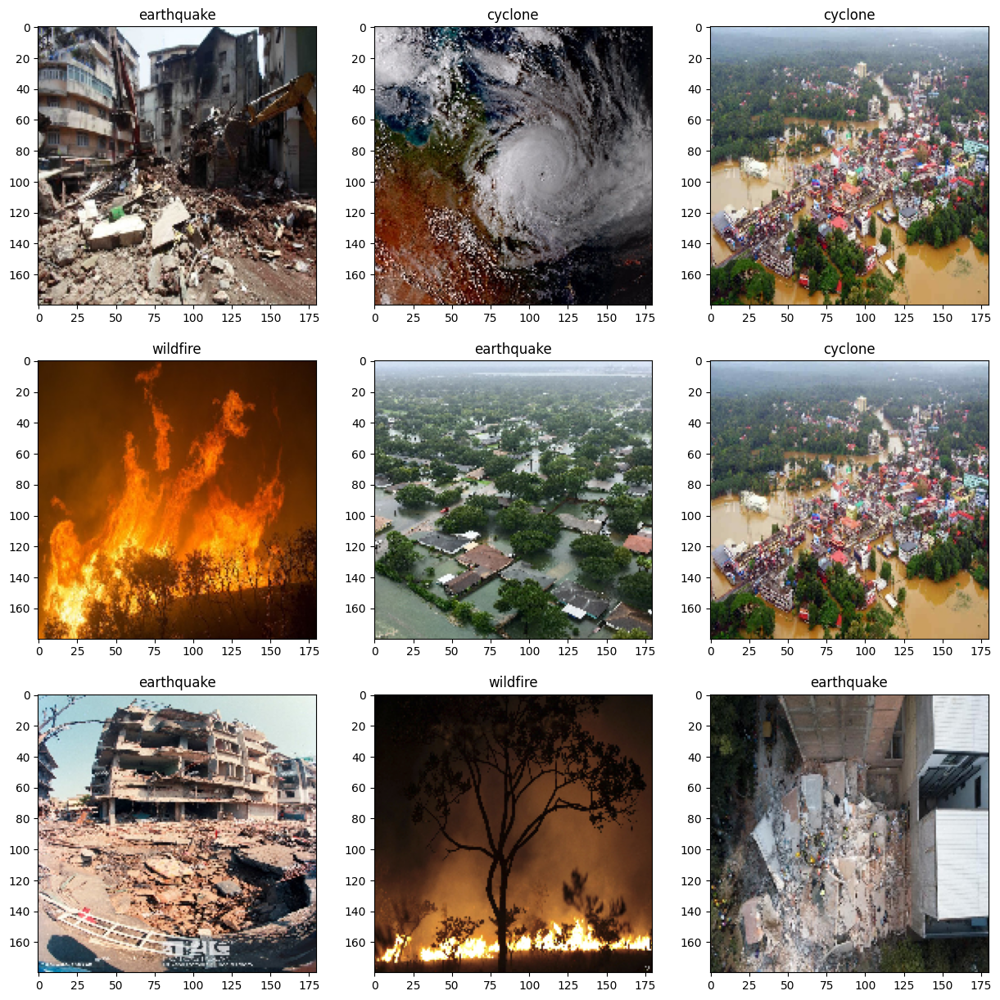

In [14]:
run_prediction()

In [15]:
best_model = '/content/best_model.h5'
model_disaster = load_model(best_model)

sample_datagen = ImageDataGenerator(rescale = 1./255)
sample_path = r'/content/drive/MyDrive/DisasterModel'

sample_generator = sample_datagen.flow_from_directory(sample_path, target_size=(180, 180), batch_size=1)

def run_visualisation():

    i = random.randint(0, len(sample_generator) - 1)

    plt.figure(figsize=(10, 10))
    predict = model_disaster.predict(sample_generator[i][0])
    title ='The image below displays a ' + str(labels[np.argmax(predict)]) +'\n'
    plt.title(title, fontsize=20)
    plt.imshow(sample_generator[i][0][0])
    plt.show()

    layer_outputs = [layer.output for layer in model_disaster.layers]
    activation_model = Model(inputs=model_disaster.input, outputs=layer_outputs)
    activations = activation_model.predict(sample_generator[i][0])

    def display_activation(activations, col_size, row_size, act_index):
        activation = activations[act_index]
        activation_index=0
        fig, ax = plt.subplots(row_size, col_size, figsize=(15, 15))
        title1 = 'Images from the layer ' + str(act_index)
        fig.suptitle(title1, fontsize=16)
        for row in range(0, row_size):
            for col in range(0, col_size):
                ax[row][col].imshow(activation[0, :, :, activation_index], cmap='gray')
                activation_index += 1

    display_activation(activations, 2, 2, 0) # Displays 4 images from the 1st layer
    plt.show()

    display_activation(activations, 2, 2, 1) # Displays 4 images from the 2nd layer
    plt.show()

    display_activation(activations, 2, 2, 3) # Displays 4 images from the 4th layer
    plt.show()

    display_activation(activations, 3, 3, 5) # Displays 9 images from the 6th layer
    plt.show()

Found 6828 images belonging to 4 classes.


1/1 [==============================] - 0s 163ms/step


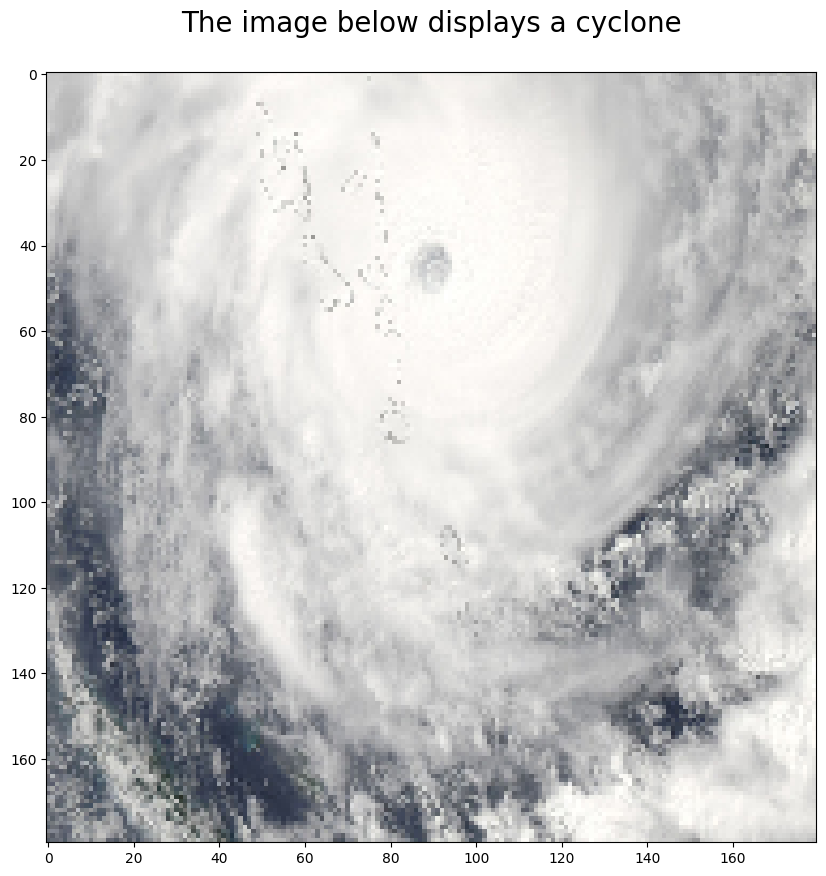

1/1 [==============================] - 0s 206ms/step


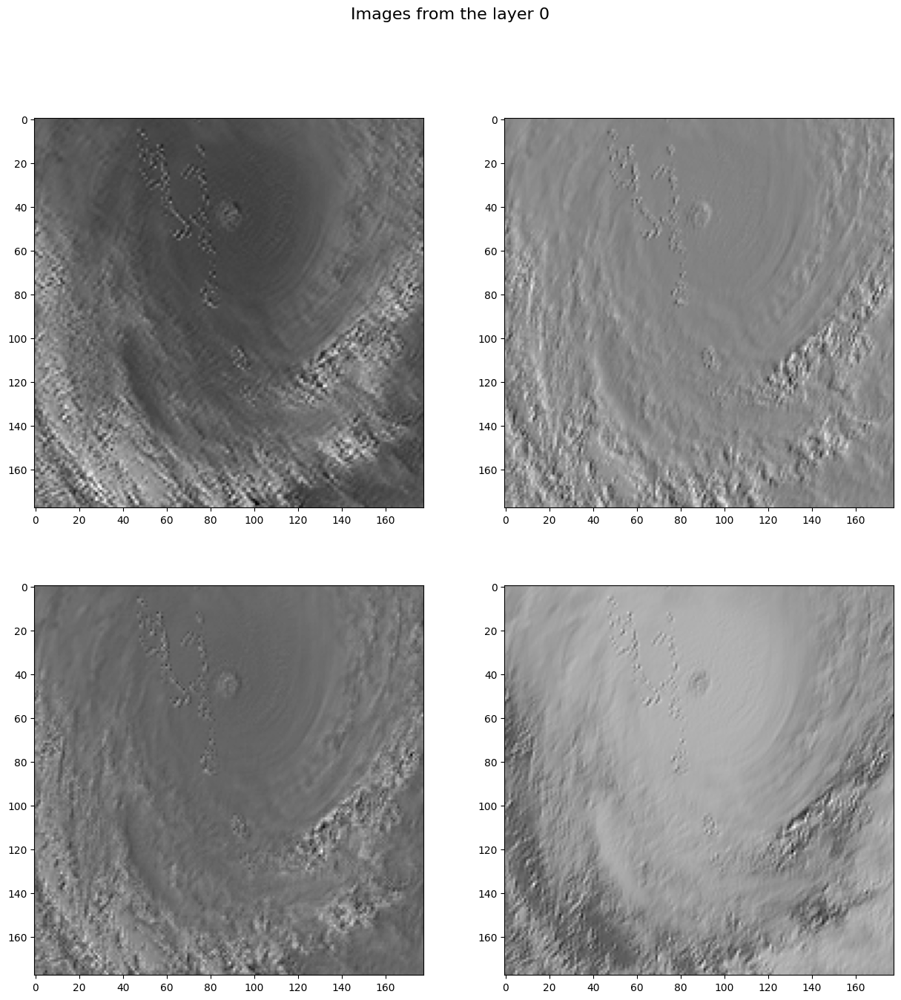

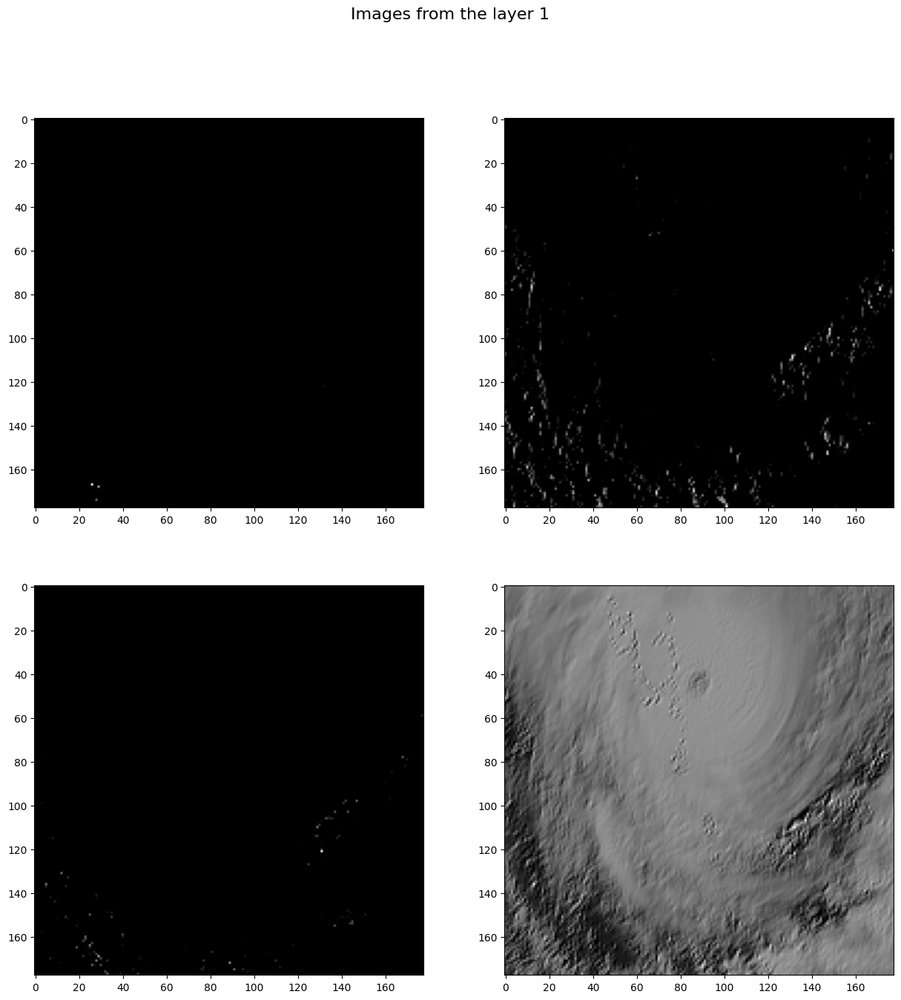

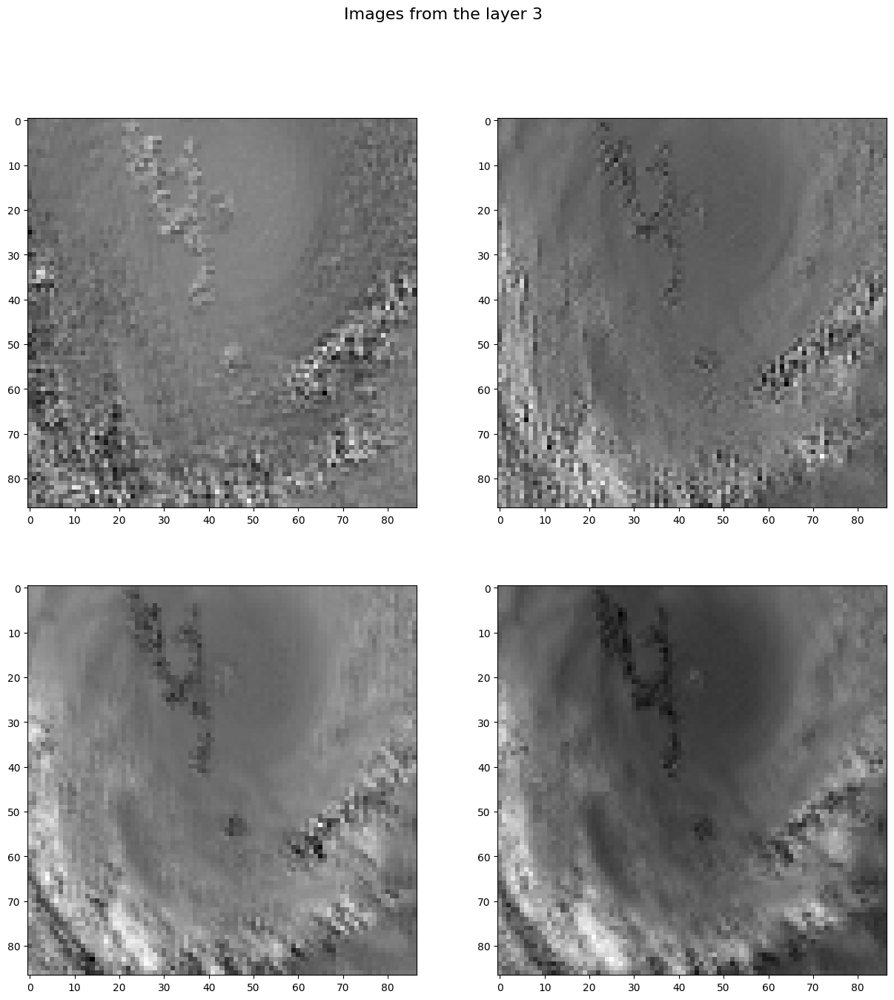

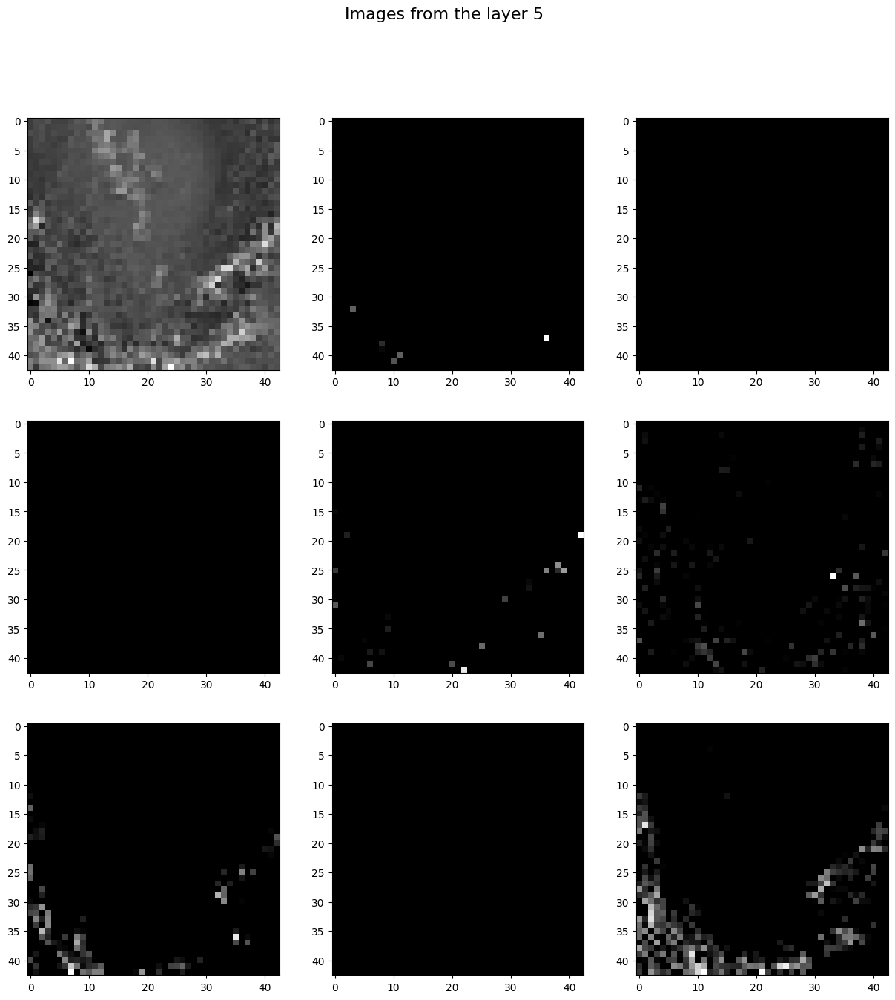

In [16]:
run_visualisation()